# Tagging images

#### GPT

Here are likely objects/tags visible in the image with approximate confidence scores (estimates):

- Colosseum / Roman amphitheater — 92%  
- ancient ruins — 95%  
- stone/brick walls — 98%  
- arches (stone archways) — 98%  
- seating tiers / spectator stands — 96%  
- arena floor — 94%  
- wooden platform/stage on arena — 80%  
- walkways / railings — 85%  
- staircases / steps — 75%  
- entrance/gate openings — 89%  
- tourists / people (small groups) — 88%  
- background buildings (modern/adjacent) — 78%  
- skylight / sky — 99%  
- clouds — 80%  
- exposed masonry / brickwork — 90%  
- metal/temporary structure (scaffolding or grating) — 60%  

Notes: these are approximate visual-confidence estimates, not measurements. If you want a more detailed breakdown (bounding boxes or counts of people), tell me which items to focus on.


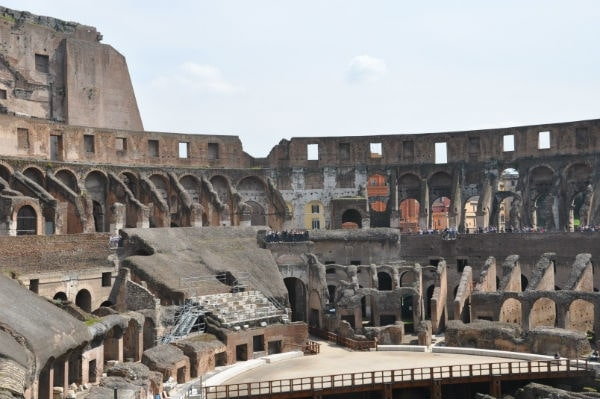

In [10]:
from openai import AzureOpenAI
import os
import base64
from azure.identity import DefaultAzureCredential, get_bearer_token_provider

token_provider = get_bearer_token_provider(
    DefaultAzureCredential(), "https://cognitiveservices.azure.com/.default"
)

IMAGE_URL = "https://raw.githubusercontent.com/Azure-Samples/cognitive-services-sample-data-files/master/ComputerVision/Images/landmark.jpg"

# Download image from URL
response = requests.get(IMAGE_URL)
image_bytes = response.content

# Encode image bytes to base64
def encode_image_from_bytes(image_bytes):
    return base64.b64encode(image_bytes).decode("utf-8")

base64_image = encode_image_from_bytes(image_bytes)

client = AzureOpenAI(
  azure_endpoint = "https://aifsweden.openai.azure.com/", 
  azure_ad_token_provider=token_provider,
  api_version="2025-03-01-preview"
)

def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

response = client.responses.create(
    model="gpt-5-mini",
    input=[
        {"role": "user", "content": "List all the things / tags in this picture with a confidence score."},
        {
            "role": "user",
            "content": [
                {
                    "type": "input_image",
                    "image_url": f"data:image/png;base64,{base64_image}"
                }
            ]
        }
    ]
)


print(response.output_text)

# Display the image
url = "https://raw.githubusercontent.com/Azure-Samples/cognitive-services-sample-data-files/master/ComputerVision/Images/landmark.jpg"
response = requests.get(url)
image = Image.open(BytesIO(response.content))

# Resize the image
image = image.resize((round(image.width / 1), round(image.height / 1)))

# Display the image
display(image)

#### GPT

- Person (face blurred): 99%
- Long blonde hair: 95%
- Brown/dark red long-sleeve top: 90%
- Wooden stake / wooden club (handheld, tapered end): 88%
- Hand holding object: 96%
- Multicolored string / fairy lights on wall: 92%
- Bicycle rims / circular metal rings mounted on wall: 80%
- Graffiti or painted wall markings: 78%
- Table or wooden sign with lettering in background: 70%
- Lamp with fabric lampshade (lit): 94%
- Couch or upholstered seating (right side): 89%
- Indoor/room scene (interior): 98%
- Warm ambient lighting: 90%

If you want, I can add bounding-box estimates for where each item appears in the image.


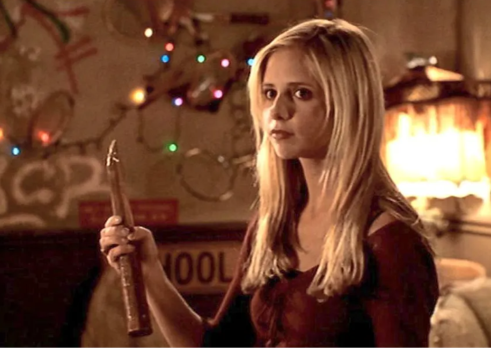

In [12]:
from openai import AzureOpenAI
import os
import base64
from azure.identity import DefaultAzureCredential, get_bearer_token_provider

token_provider = get_bearer_token_provider(
    DefaultAzureCredential(), "https://cognitiveservices.azure.com/.default"
)

IMAGE_PATH = "./images/buffystake.png"

def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

base64_image = encode_image(IMAGE_PATH)

client = AzureOpenAI(
  azure_endpoint = "https://aifsweden.openai.azure.com/", 
  azure_ad_token_provider=token_provider,
  api_version="2025-03-01-preview"
)

def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

response = client.responses.create(
    model="gpt-5-mini",
    input=[
        {"role": "user", "content": "List all the things / tags in this picture with a confidence score."},
        {
            "role": "user",
            "content": [
                {
                    "type": "input_image",
                    "image_url": f"data:image/png;base64,{base64_image}"
                }
            ]
        }
    ]
)

print(response.output_text)

from PIL import Image
from IPython.display import display
image = Image.open(IMAGE_PATH)
image = image.resize((round(image.width/3), round(image.height/3)))
display(image)

# Object Detection

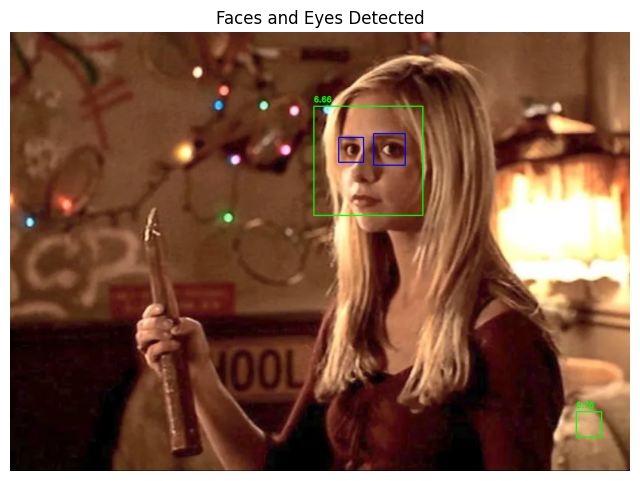

In [20]:
import cv2
import matplotlib.pyplot as plt

# Load cascades
face_cascade = cv2.CascadeClassifier('./Cascades/haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier('./Cascades/haarcascade_eye.xml')

# Read image
image = cv2.imread("./images/buffystake.png")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Detect faces
rects, neighbors, weights = face_cascade.detectMultiScale3(
    gray,
    scaleFactor=1.1,
    minNeighbors=5,
    minSize=(30, 30),
    flags=cv2.CASCADE_SCALE_IMAGE,
    outputRejectLevels=True
)

# Draw faces and detect eyes
for i, (x, y, w, h) in enumerate(rects):
    confidence = weights[i]

    # Draw face rectangle
    cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # Add confidence label
    cv2.putText(image, f"{confidence:.2f}", (x, y - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    # --- Detect eyes within face ROI ---
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = image[y:y+h, x:x+w]

    eyes = eye_cascade.detectMultiScale(
        roi_gray,
        scaleFactor=1.1,
        minNeighbors=8,
        minSize=(15, 15)
    )

    # Draw eye rectangles
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (255, 0, 0), 2)

# Convert BGR → RGB for display
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Show in notebook
plt.figure(figsize=(8, 6))
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Faces and Eyes Detected")
plt.show()


# Cascades with Camera

In [ ]:
# Install (run once in a cell)
# !pip install opencv-python matplotlib

import cv2 as cv
import matplotlib.pyplot as plt
from IPython.display import clear_output

# -----------------------------
# Load Haar Cascades
# -----------------------------
face_cascade_name = './Cascades/haarcascade_frontalface_default.xml'
eyes_cascade_name = './Cascades/haarcascade_eye_tree_eyeglasses.xml'

face_cascade = cv.CascadeClassifier()
eyes_cascade = cv.CascadeClassifier()

if not face_cascade.load(face_cascade_name):
    print('--(!)Error loading face cascade')
    raise SystemExit

if not eyes_cascade.load(eyes_cascade_name):
    print('--(!)Error loading eyes cascade')
    raise SystemExit


# -----------------------------
# Detection function (unchanged logic)
# -----------------------------
def detectAndDisplay(frame):
    frame_gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    frame_gray = cv.equalizeHist(frame_gray)

    faces = face_cascade.detectMultiScale(frame_gray)

    for (x, y, w, h) in faces:
        center = (x + w//2, y + h//2)
        cv.ellipse(frame, center, (w//2, h//2), 0, 0, 360, (255, 0, 255), 4)

        faceROI = frame_gray[y:y+h, x:x+w]
        eyes = eyes_cascade.detectMultiScale(faceROI)

        for (x2, y2, w2, h2) in eyes:
            eye_center = (x + x2 + w2//2, y + y2 + h2//2)
            radius = int(round((w2 + h2) * 0.25))
            cv.circle(frame, eye_center, radius, (255, 0, 0), 4)

    return frame


# -----------------------------
# Display helper (NOTEBOOK SAFE)
# -----------------------------
def show_frame(frame):
    frame_rgb = cv.cvtColor(frame, cv.COLOR_BGR2RGB)
    plt.imshow(frame_rgb)
    plt.axis('off')
    plt.show()


# -----------------------------
# Webcam loop (notebook-friendly)
# -----------------------------
cap = cv.VideoCapture(0)

if not cap.isOpened():
    print('--(!)Error opening video capture')
    raise SystemExit

try:
    for _ in range(100):  # limit frames (avoid notebook freeze)
        ret, frame = cap.read()

        if not ret or frame is None:
            print('--(!) No captured frame -- Break!')
            break

        frame = detectAndDisplay(frame)

        clear_output(wait=True)
        show_frame(frame)

except KeyboardInterrupt:
    print("Stopped manually")

finally:
    cap.release()


In [ ]:
# ## only run once
# ## Takes 3 mins
#
# from ultralytics import YOLO
# # Load a COCO-pretrained YOLO26n model
# model = YOLO("./YOLO/yolo26n.pt")

# # Train the model on the COCO8 example dataset for 100 epochs
# results = model.train(data="coco8.yaml", epochs=100, imgsz=640)


# names:
#   0: person
#   1: bicycle
#   2: car
#   3: motorcycle
#   4: airplane
#   5: bus
#   6: train
#   7: truck
#   8: boat
#   9: traffic light
#   10: fire hydrant
#   11: stop sign
#   12: parking meter
#   13: bench
#   14: bird
#   15: cat
#   16: dog
#   17: horse
#   18: sheep
#   19: cow
#   20: elephant
#   21: bear
#   22: zebra
#   23: giraffe
#   24: backpack
#   25: umbrella
#   26: handbag
#   27: tie
#   28: suitcase
#   29: frisbee
#   30: skis
#   31: snowboard
#   32: sports ball
#   33: kite
#   34: baseball bat
#   35: baseball glove
#   36: skateboard
#   37: surfboard
#   38: tennis racket
#   39: bottle
#   40: wine glass
#   41: cup
#   42: fork
#   43: knife
#   44: spoon
#   45: bowl
#   46: banana
#   47: apple
#   48: sandwich
#   49: orange
#   50: broccoli
#   51: carrot
#   52: hot dog
#   53: pizza
#   54: donut
#   55: cake
#   56: chair
#   57: couch
#   58: potted plant
#   59: bed
#   60: dining table
#   61: toilet
#   62: tv
#   63: laptop
#   64: mouse
#   65: remote
#   66: keyboard
#   67: cell phone
#   68: microwave
#   69: oven
#   70: toaster
#   71: sink
#   72: refrigerator
#   73: book
#   74: clock
#   75: vase
#   76: scissors
#   77: teddy bear
#   78: hair drier
#   79: toothbrush


Ultralytics 8.4.59  Python-3.13.13 torch-2.8.0+cpu CPU (AMD Ryzen 7 PRO 7840HS w/ Radeon 780M Graphics)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=coco8.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=./YOLO/yolo26n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train-2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, pa

# YOLO


0: 384x640 12 persons, 1 handbag, 50.5ms
Speed: 3.2ms preprocess, 50.5ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)


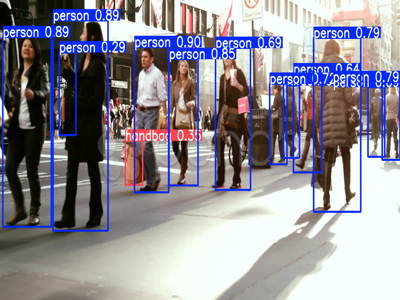

In [31]:
from ultralytics import YOLO
import urllib.request
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
import cv2

model = YOLO("./YOLO/yolo26n.pt")

img = Image.open("./images/road.jpg")
img_np = np.array(img)

# Run inference with the YOLO26n model on the 'bus.jpg' image
results = model(img)

img = results[0].plot()

# Convert BGR → RGB
img_rgb = img[..., ::-1]

Image.fromarray(img_rgb).resize((400, 300))


image 1/1 c:\Users\rolester\OneDrive - Microsoft\WorkFolders\Python\AIvsML\images\buffystake.png: 480x640 1 person, 38.6ms
Speed: 3.2ms preprocess, 38.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)


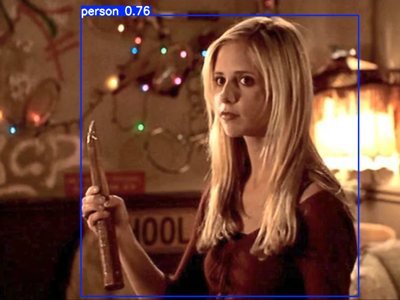

In [20]:
from ultralytics import YOLO
from PIL import Image
import numpy as np

# Load a COCO-pretrained YOLO26n model
model = YOLO("./YOLO/yolo26n.pt")

# Run inference with the YOLO26n model on the 'bus.jpg' image
results = model("./images/buffystake.png")

img = results[0].plot()

# Convert BGR → RGB
img_rgb = img[..., ::-1]

Image.fromarray(img_rgb).resize((400, 300))



image 1/1 c:\Users\rolester\OneDrive - Microsoft\WorkFolders\Python\AIvsML\images\buffystake.png: 480x640 1 face, 63.6ms
Speed: 3.5ms preprocess, 63.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


<>:2: SyntaxWarning: invalid escape sequence '\Y'
<>:2: SyntaxWarning: invalid escape sequence '\Y'
C:\Users\rolester\AppData\Local\Temp\ipykernel_38824\2512853753.py:2: SyntaxWarning: invalid escape sequence '\Y'
  model = YOLO(".\YOLO\yolov8n-face-lindevs.pt")


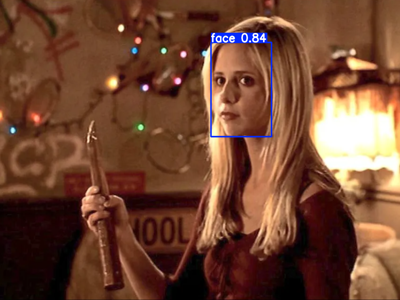

In [24]:
#Yolo trained on face
model = YOLO(".\YOLO\yolov8n-face-lindevs.pt")
# Run inference with the YOLO26n model on the 'bus.jpg' image
results = model("./images/buffystake.png")

img = results[0].plot()

# Convert BGR → RGB
img_rgb = img[..., ::-1]

Image.fromarray(img_rgb).resize((400, 300))


# Camera with face

In [ ]:
import cv2 as cv
from ultralytics import YOLO
from IPython.display import clear_output
from PIL import Image

# Load your YOLO face model
model = YOLO("./YOLO/yolov8n-face-lindevs.pt")

# Open camera
cap = cv.VideoCapture(0)

if not cap.isOpened():
    print('--(!)Error opening video capture')
    raise SystemExit

try:
    for _ in range(100):  # limit frames (avoid notebook freeze)
        ret, frame = cap.read()

        if not ret or frame is None:
            print('--(!) No captured frame -- Break!')
            break

        # Run YOLO on frame
        results = model(frame)

        # Draw detections
        img = results[0].plot()

        # Fix colour (BGR → RGB)
        img = img[..., ::-1]

        # Resize (optional)
        img_small = Image.fromarray(img).resize((400, 300))

        # Display inline
        clear_output(wait=True)
        display(img_small)

except KeyboardInterrupt:
    print("Stopped manually")

finally:
    cap.release()

# Camera with base model

In [ ]:
import cv2 as cv
from ultralytics import YOLO
from IPython.display import clear_output
from PIL import Image

# Load your YOLO face model
model = YOLO("./YOLO/yolo26n.pt")

# Open camera
cap = cv.VideoCapture(0)

if not cap.isOpened():
    print('--(!)Error opening video capture')
    raise SystemExit

try:
    for _ in range(100):  # limit frames (avoid notebook freeze)
        ret, frame = cap.read()

        if not ret or frame is None:
            print('--(!) No captured frame -- Break!')
            break

        # Run YOLO on frame
        results = model(frame)

        # Draw detections
        img = results[0].plot()

        # Fix colour (BGR → RGB)
        img = img[..., ::-1]

        # Resize (optional)
        img_small = Image.fromarray(img).resize((400, 300))

        # Display inline
        clear_output(wait=True)
        display(img_small)

except KeyboardInterrupt:
    print("Stopped manually")

finally:
    cap.release()

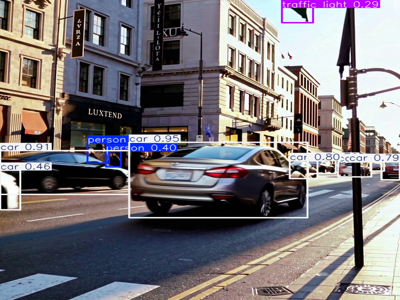

In [34]:
from ultralytics import YOLO
from PIL import Image
import cv2
from IPython.display import display, clear_output

model = YOLO("./YOLO/yolo26n.pt")

video_path = "video/road2.mp4"
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error: Could not open video.")
    exit()

try:
    frame_skip = 2  # helps performance

    i = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Skip frames for speed (optional)
        if i % frame_skip != 0:
            i += 1
            continue

        # Run YOLO
        results = model(frame)

        # Draw detections
        img = results[0].plot()

        # Fix colour (BGR → RGB)
        img = img[..., ::-1]

        # Resize for notebook display
        img_small = Image.fromarray(img).resize((400, 300))

        # Display inline
        clear_output(wait=True)
        display(img_small)

        i += 1

except KeyboardInterrupt:
    print("Stopped manually")

finally:
    cap.release()

#### GPT - base - no  tools

Below are the detected things/tags I can identify in the image (excluding the blurred face), each with a best-effort confidence score and a rough bounding box in pixel coordinates (x1, y1, x2, y2). I estimated the coordinates from the provided image (image size used: width=1035 px, height=768 px). These are approximate — if you run a real detector you would replace them with the detector outputs.

Detections (label — confidence — bbox (x1,y1,x2,y2)):
- person (torso / body, excluding blurred face) — 0.97 — (430, 80, 1000, 740)
- blonde hair (hair region, excluding face) — 0.93 — (530, 100, 840, 460)
- top / brown shirt — 0.90 — (520, 320, 840, 620)
- hand (left hand holding object) — 0.92 — (140, 320, 260, 460)
- wooden stick / bat (object being held) — 0.88 — (150, 200, 270, 640)
- lamp (table/standing lamp, right background) — 0.86 — (820, 140, 1035, 380)
- string lights / colored bulbs (wall decoration) — 0.84 — (300, 40, 520, 200)
- bicycle rims / circular wall decorations — 0.75 —

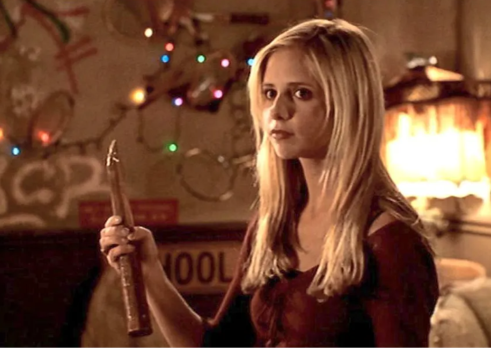

In [10]:
from PIL import Image, ImageDraw, ImageFont

from openai import AzureOpenAI
import os
import base64
from azure.identity import DefaultAzureCredential, get_bearer_token_provider

token_provider = get_bearer_token_provider(
    DefaultAzureCredential(), "https://cognitiveservices.azure.com/.default"
)

IMAGE_PATH = "./images/buffystake.png"

def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

base64_image = encode_image(IMAGE_PATH)

client = AzureOpenAI(
  azure_endpoint = "https://aifsweden.openai.azure.com/", 
  azure_ad_token_provider=token_provider,
  api_version="2025-03-01-preview"
)

def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

response = client.responses.create(
    model="gpt-5-mini",
    input=[
        {"role": "user", "content": "List all the things / tags in this picture with a confidence score. Give me the python code with opencv2 to open the image and draw bounding boxes"},
        {
            "role": "user",
            "content": [
                {
                    "type": "input_image",
                    "image_url": f"data:image/png;base64,{base64_image}"
                }
            ]
        }
    ]
)

print(response.output_text)

from PIL import Image
from IPython.display import display
image = Image.open(IMAGE_PATH)
image = image.resize((round(image.width/3), round(image.height/3)))
display(image)


<>:50: SyntaxWarning: invalid escape sequence '\i'
<>:50: SyntaxWarning: invalid escape sequence '\i'
C:\Users\rolester\AppData\Local\Temp\ipykernel_29792\1288078510.py:50: SyntaxWarning: invalid escape sequence '\i'
  out_path = "images\image_with_boxes.jpg"


Saved annotated image to images\image_with_boxes.jpg


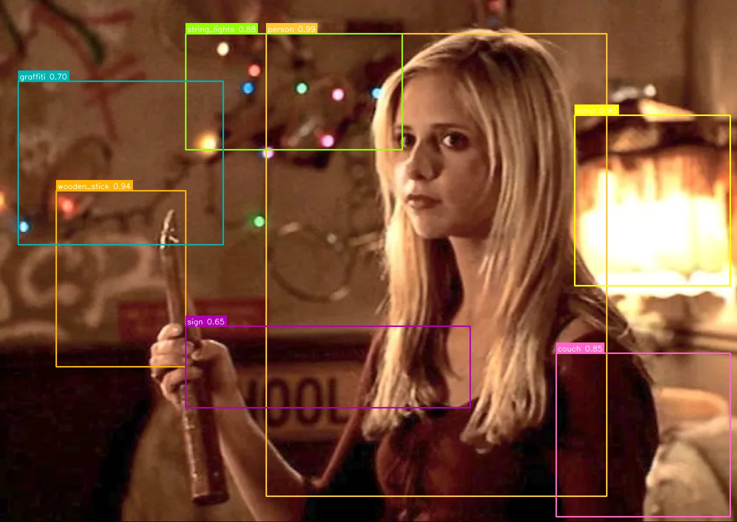

In [2]:
import cv2

# Path to your image
img_path = "./images/buffystake.png"
img = cv2.imread(img_path)
if img is None:
    raise FileNotFoundError(f"Image not found: {img_path}")

h, w = img.shape[:2]

# Boxes defined as (x_min_frac, y_min_frac, x_max_frac, y_max_frac)
# These are approximate, derived from visual inspection of the provided image.
detections = [
    {"label": "person", "conf": 0.99, "box": (0.361, 0.065, 0.823, 0.951), "color": (50, 200, 255)},
    {"label": "wooden_stick", "conf": 0.94, "box": (0.076, 0.365, 0.252, 0.703), "color": (0, 180, 255)},
    {"label": "lamp", "conf": 0.90, "box": (0.780, 0.221, 0.991, 0.547), "color": (0, 255, 255)},
    {"label": "string_lights", "conf": 0.88, "box": (0.252, 0.065, 0.546, 0.287), "color": (0, 255, 150)},
    {"label": "couch", "conf": 0.85, "box": (0.755, 0.677, 0.991, 0.990), "color": (200, 100, 255)},
    {"label": "graffiti", "conf": 0.70, "box": (0.025, 0.156, 0.303, 0.469), "color": (180, 180, 0)},
    {"label": "sign", "conf": 0.65, "box": (0.252, 0.625, 0.638, 0.781), "color": (180, 0, 180)},
]

# Draw boxes
for det in detections:
    x1f, y1f, x2f, y2f = det["box"]
    x1, y1 = int(x1f * w), int(y1f * h)
    x2, y2 = int(x2f * w), int(y2f * h)
    color = det.get("color", (0, 255, 0))
    label = f"{det['label']} {det['conf']:.2f}"

    # Draw rectangle
    cv2.rectangle(img, (x1, y1), (x2, y2), color, thickness=2)

    # Draw filled rectangle for text background
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.5
    thickness = 1
    (text_w, text_h), baseline = cv2.getTextSize(label, font, font_scale, thickness)
    # Make sure the background rectangle is within image bounds
    text_bg_x1 = x1
    text_bg_y1 = max(0, y1 - text_h - baseline - 4)
    text_bg_x2 = x1 + text_w + 6
    text_bg_y2 = y1
    cv2.rectangle(img, (text_bg_x1, text_bg_y1), (text_bg_x2, text_bg_y2), color, cv2.FILLED)

    # Put text (white)
    cv2.putText(img, label, (x1 + 3, y1 - 4), font, font_scale, (255, 255, 255), thickness, cv2.LINE_AA)

# Save and show the result
out_path = "images\image_with_boxes.jpg"
cv2.imwrite(out_path, img)
print(f"Saved annotated image to {out_path}")

# # Optionally display (press any key to close)
# cv2.imshow("Detections", img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()


from PIL import Image
from IPython.display import display
image = Image.open(out_path)
image = image.resize((round(image.width/2), round(image.height/2)))
display(image)



# Custom image detection - jewelry

Summary
- Image size (pixels): width = 1365, height = 768 (1365x768).
- Below I list visible jewelry I can see in the photo (excluding blurred faces) with a confidence score and an estimated bounding box given both as normalized coordinates (fractions of width/height) and as absolute pixel coordinates (x_min, y_min, x_max, y_max). These boxes were placed by visually inspecting the image; the code after the list will draw them dynamically so they remain correct regardless of aspect ratio or resizing in a Jupyter notebook.

Jewelry list (estimated)
1) Left-most woman — earring (small stud)  
   - Confidence: 0.90  
   - Normalized bbox (x_min, y_min, x_max, y_max): (0.12, 0.28, 0.18, 0.38)  
   - Absolute bbox (pixels): (164, 215, 246, 292)

2) Blonde (center-right) — dangling earring (visible on her left/right side)  
   - Confidence: 0.95  
   - Normalized bbox: (0.65, 0.12, 0.69, 0.24)  
   - Absolute bbox: (887, 92, 942, 184)

3) Blonde — ring(s) on hand (hand resting on the red-dres

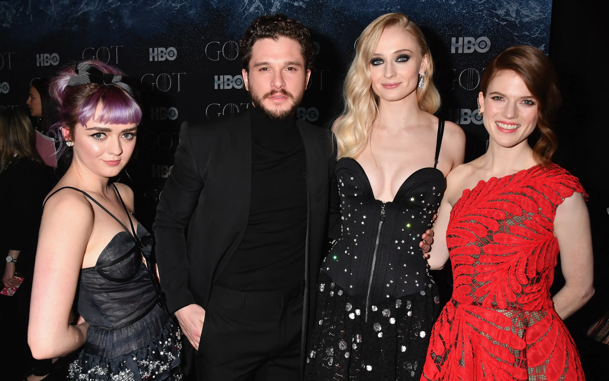

In [35]:
from PIL import Image, ImageDraw, ImageFont

from openai import AzureOpenAI
import os
import base64
from azure.identity import DefaultAzureCredential, get_bearer_token_provider

token_provider = get_bearer_token_provider(
    DefaultAzureCredential(), "https://cognitiveservices.azure.com/.default"
)

IMAGE_PATH = "./images/GOT.png"

def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

base64_image = encode_image(IMAGE_PATH)

client = AzureOpenAI(
  azure_endpoint = "https://aifsweden.openai.azure.com/", 
  azure_ad_token_provider=token_provider,
  api_version="2025-03-01-preview"
)

def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

response = client.responses.create(
    model="gpt-5-mini",
    input=[
        {"role": "user", "content": "List all the jewelry in this picture with a confidence score. Tell me the size of the image. Give me the python code with opencv2 to open the image and draw bounding boxes. Make sure to take into account the aspect ratio. We will be diplaying in a jupyter notebook and we need the bounding boxes to be in the right place. Make sure to make the scale dynamic in relation to the size of the image. We want the boxes to be as accurate as possible.( you normally do not place them on the picture correctly but this time do it correctly. Make sure you Dynamically scale position)"},
        {
            "role": "user",
            "content": [
                {
                    "type": "input_image",
                    "image_url": f"data:image/png;base64,{base64_image}"
                }
            ]
        }
    ]
)

print(response.output_text)

from PIL import Image
from IPython.display import display
image = Image.open(IMAGE_PATH)
image = image.resize((round(image.width/3), round(image.height/3)))
display(image)


#### Run the code created 1st attempt

Loaded image: ./images/GOT.png (width x height) = 1827 x 1142


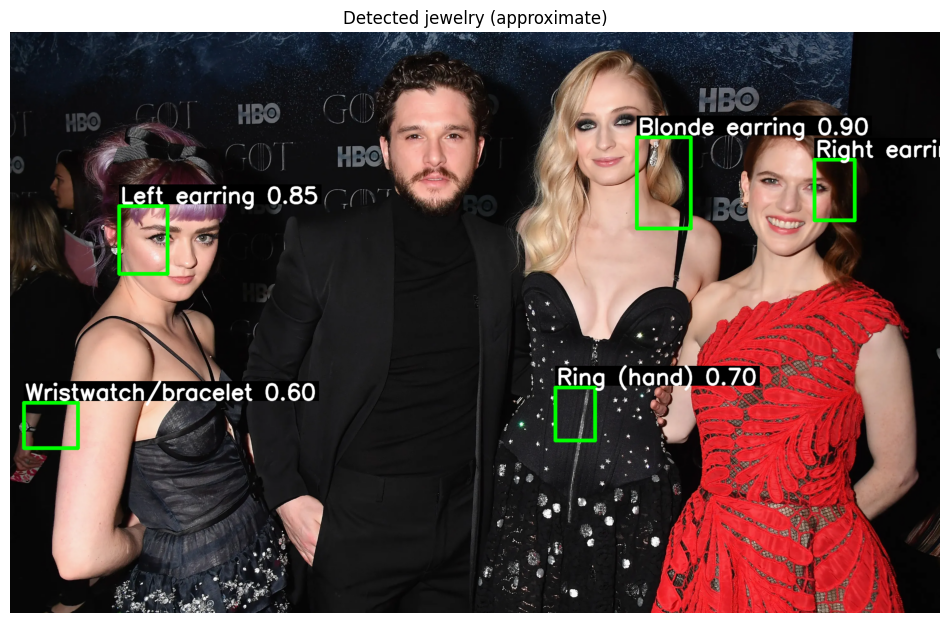


Pixel bounding boxes used (xmin, ymin, xmax, ymax):
- Left earring: conf=0.85, pixels=[214, 343, 309, 476]
- Blonde earring: conf=0.90, pixels=[1231, 208, 1337, 387]
- Right earring: conf=0.90, pixels=[1580, 252, 1659, 371]
- Ring (hand): conf=0.70, pixels=[1071, 699, 1149, 803]
- Wristwatch/bracelet: conf=0.60, pixels=[27, 729, 133, 818]


In [15]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# --- Replace with your image path ---
IMAGE_PATH = "./images/GOT.png"   

# Normalized bounding boxes (x_min, y_min, x_max, y_max) between 0 and 1.
# These were estimated from the supplied image. They will be converted to pixel coords dynamically.
detections = [
    {"label": "Left earring", "conf": 0.85, "bbox": [0.117, 0.300, 0.169, 0.417]},
    {"label": "Blonde earring", "conf": 0.90, "bbox": [0.674, 0.182, 0.732, 0.339]},
    {"label": "Right earring", "conf": 0.90, "bbox": [0.865, 0.221, 0.908, 0.325]},
    {"label": "Ring (hand)", "conf": 0.70, "bbox": [0.586, 0.612, 0.629, 0.703]},
    {"label": "Wristwatch/bracelet", "conf": 0.60, "bbox": [0.015, 0.638, 0.073, 0.716]},
]

# Load image using OpenCV (BGR)
img_bgr = cv2.imread(IMAGE_PATH)
if img_bgr is None:
    raise FileNotFoundError(f"Could not open image at '{IMAGE_PATH}'. Make sure the path is correct.")

# Get image size
H, W = img_bgr.shape[:2]
print(f"Loaded image: {IMAGE_PATH} (width x height) = {W} x {H}")

# Convert to RGB for displaying with matplotlib
img_disp = cv2.cvtColor(img_bgr.copy(), cv2.COLOR_BGR2RGB)

# Dynamic drawing parameters (scale with image size)
diag = np.sqrt(W*W + H*H)
thickness = max(1, int(round(diag * 0.003)))           # line thickness relative to diagonal
font_scale = max(0.4, diag / 1500.0)                   # font scale relative to diagonal
text_thickness = max(1, int(round(thickness / 2)))

# Draw each detection (convert normalized bbox to pixel coords)
for det in detections:
    x_min_n, y_min_n, x_max_n, y_max_n = det["bbox"]
    # Clamp normalized values
    x_min_n = max(0.0, min(1.0, x_min_n))
    y_min_n = max(0.0, min(1.0, y_min_n))
    x_max_n = max(0.0, min(1.0, x_max_n))
    y_max_n = max(0.0, min(1.0, y_max_n))

    x_min = int(round(x_min_n * W))
    y_min = int(round(y_min_n * H))
    x_max = int(round(x_max_n * W))
    y_max = int(round(y_max_n * H))

    label = f"{det['label']} {det['conf']:.2f}"

    # Choose color (BGR) - visually distinguishable
    color = (0, 255, 0)  # green in BGR for box
    # Draw rectangle (on BGR copy for accurate thickness)
    cv2.rectangle(img_bgr, (x_min, y_min), (x_max, y_max), color, thickness, lineType=cv2.LINE_AA)

    # Put label: draw filled rectangle behind text for readability
    ((text_w, text_h), _) = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, text_thickness)
    # Make sure label background fits; place it above the box if possible, otherwise below
    text_bg_x1 = x_min
    text_bg_x2 = x_min + text_w + 6
    text_bg_h = text_h + 6
    if y_min - text_bg_h - 4 >= 0:
        text_bg_y1 = y_min - text_bg_h - 4
        text_origin_y = y_min - 6
    else:
        text_bg_y1 = y_max + 4
        text_origin_y = y_max + text_h + 6
    text_bg_y2 = text_bg_y1 + text_bg_h

    # Draw background rectangle (filled)
    cv2.rectangle(img_bgr, (text_bg_x1, text_bg_y1), (text_bg_x2, text_bg_y2), (0, 0, 0), -1)
    # Put text (white)
    cv2.putText(img_bgr, label, (text_bg_x1 + 3, text_origin_y),
                cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), text_thickness, lineType=cv2.LINE_AA)

# Convert final annotated image to RGB for display
img_annotated = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Display in notebook using matplotlib
plt.figure(figsize=(12, 8))
plt.imshow(img_annotated)
plt.axis('off')
plt.title('Detected jewelry (approximate)')
plt.show()

# Optionally: print pixel boxes used
print("\nPixel bounding boxes used (xmin, ymin, xmax, ymax):")
for det in detections:
    xn, yn, xxn, yyn = det["bbox"]
    xmin = int(round(xn * W)); ymin = int(round(yn * H))
    xmax = int(round(xxn * W)); ymax = int(round(yyn * H))
    print(f"- {det['label']}: conf={det['conf']:.2f}, pixels=[{xmin}, {ymin}, {xmax}, {ymax}]")

#### Run the code created 2nd attempt

Image size (width x height): 1827 x 1142


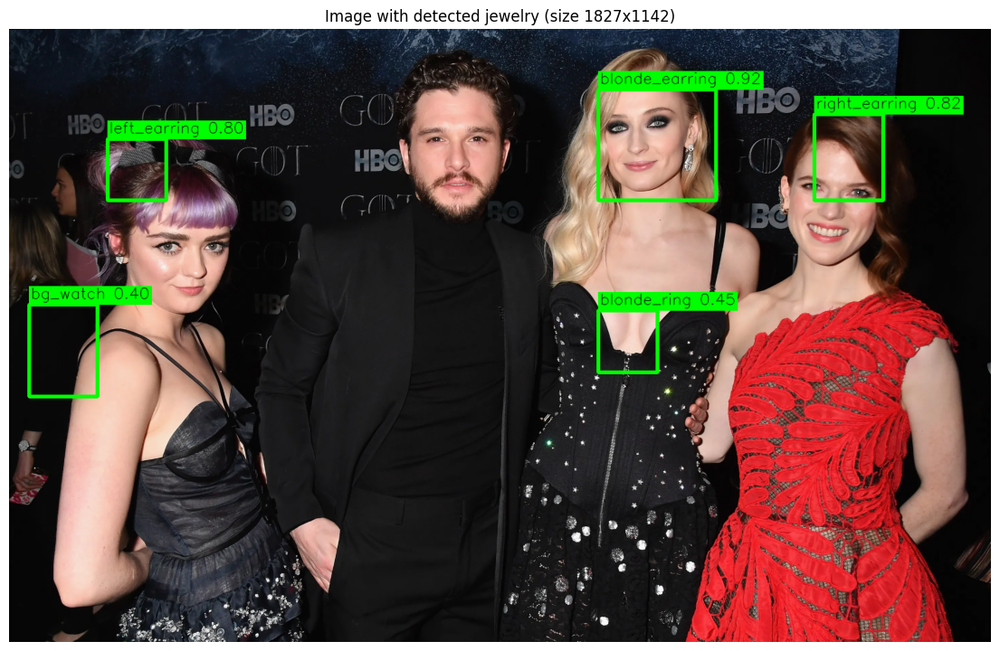

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- CONFIG: path to your image file ---
image_path = "./images/GOT.png"   

# Normalized bounding boxes and labels (xmin, ymin, xmax, ymax) relative to width/height
detections = [
    {"label": "left_earring",  "conf": 0.80, "bbox": (0.10, 0.18, 0.16, 0.28)},
    {"label": "blonde_earring","conf": 0.92, "bbox": (0.60, 0.10, 0.72, 0.28)},
    {"label": "right_earring", "conf": 0.82, "bbox": (0.82, 0.14, 0.89, 0.28)},
    {"label": "blonde_ring",   "conf": 0.45, "bbox": (0.60, 0.46, 0.66, 0.56)},
    {"label": "bg_watch",      "conf": 0.40, "bbox": (0.02, 0.45, 0.09, 0.60)},
]

# Load image
img = cv2.imread(image_path)
if img is None:
    raise FileNotFoundError(f"Could not load image at '{image_path}'. Check the path.")

height, width = img.shape[:2]
print("Image size (width x height):", width, "x", height)

# Dynamic drawing parameters based on image size
min_dim = min(width, height)
line_thickness = max(1, int(round(min_dim / 200.0)))   # thickness scales with image size
font_scale = max(0.4, min_dim / 1200.0)                # text scale
font_thickness = max(1, int(round(min_dim / 800.0)))

# Convert normalized boxes to pixel coordinates and draw
img_draw = img.copy()

for d in detections:
    xmin_n, ymin_n, xmax_n, ymax_n = d["bbox"]
    # Convert to pixel coords and clip to image bounds
    x1 = int(round(xmin_n * width))
    y1 = int(round(ymin_n * height))
    x2 = int(round(xmax_n * width))
    y2 = int(round(ymax_n * height))
    x1 = max(0, min(x1, width - 1))
    y1 = max(0, min(y1, height - 1))
    x2 = max(0, min(x2, width - 1))
    y2 = max(0, min(y2, height - 1))
    color = (0, 255, 0)  # BGR (green). Change if you want different colors.

    # Draw rectangle
    cv2.rectangle(img_draw, (x1, y1), (x2, y2), color, thickness=line_thickness)

    # Label with name and confidence
    label = f"{d['label']} {d['conf']:.2f}"
    # Calculate text size to draw background rectangle
    (text_w, text_h), baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, font_thickness)
    # Put a filled rectangle behind the text for readability
    text_bg_tl = (x1, max(0, y1 - text_h - baseline - 4))
    text_bg_br = (x1 + text_w + 6, y1)
    cv2.rectangle(img_draw, text_bg_tl, text_bg_br, color, thickness=-1)
    # Put text over rectangle (use black text)
    text_org = (x1 + 3, y1 - baseline - 2)
    cv2.putText(img_draw, label, text_org, cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0), font_thickness, lineType=cv2.LINE_AA)

# Convert BGR to RGB for matplotlib display
img_rgb = cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB)

# Display in notebook
plt.figure(figsize=(14, 14))
plt.imshow(img_rgb)
plt.axis('off')
plt.title(f"Image with detected jewelry (size {width}x{height})")
plt.show()

#### Run the code created 3rd attempt

Image shape: (1142, 1827, 3)
Annotated image saved to images\image_with_jewelry_boxes.jpg


<>:49: SyntaxWarning: invalid escape sequence '\i'
<>:49: SyntaxWarning: invalid escape sequence '\i'
C:\Users\rolester\AppData\Local\Temp\ipykernel_28164\3062831597.py:49: SyntaxWarning: invalid escape sequence '\i'
  out_path = "images\image_with_jewelry_boxes.jpg"


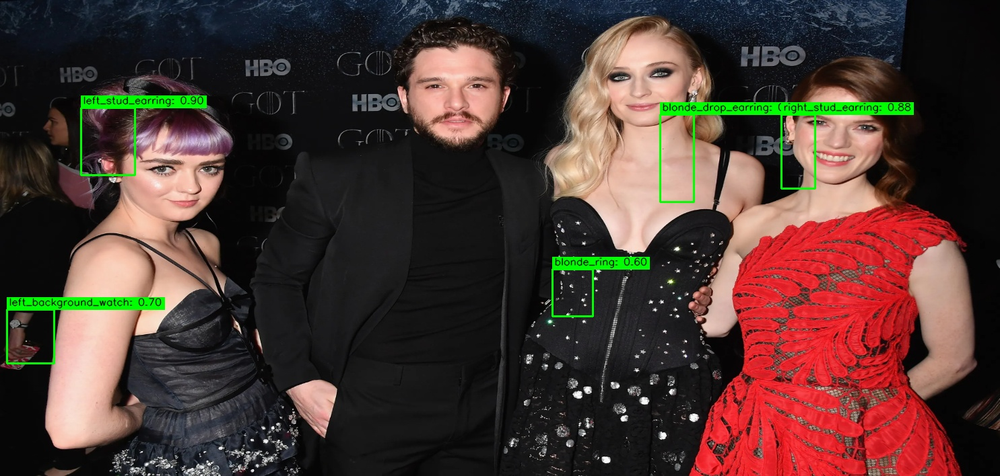

In [27]:
import cv2

# Path to input image
img_path = "./images/GOT.png"   # replace with your filename

# Load image
img = cv2.imread(img_path)

print(f"Image shape: {img.shape}")  # (height, width, channels)

#resize to Width x Height: 1365 x 768 pixels
img = cv2.resize(img, (1485, 708))


if img is None:
    raise FileNotFoundError(f"Could not open image at {img_path}")


# Define detections: (label, confidence, (x1,y1,x2,y2))
detections = [
    ("left_stud_earring", 0.90, (120, 160, 200, 260)),
    ("blonde_drop_earring", 0.92, (980, 170, 1030, 300)),
    ("right_stud_earring", 0.88, (1160, 170, 1210, 280)),
    ("left_background_watch", 0.70, (10, 460, 80, 540)),
    ("blonde_ring", 0.60, (820, 400, 880, 470)),
]

# Draw boxes and labels
for label, conf, (x1, y1, x2, y2) in detections:
    # Box
    color = (0, 255, 0)  # green
    thickness = 2
    cv2.rectangle(img, (x1, y1), (x2, y2), color, thickness)

    # Label text: "label: 0.98"
    text = f"{label}: {conf:.2f}"
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.5
    text_thickness = 1

    # Determine text size and background rectangle for readability
    (text_w, text_h), _ = cv2.getTextSize(text, font, font_scale, text_thickness)
    text_bg_tl = (x1, max(0, y1 - text_h - 6))
    text_bg_br = (x1 + text_w + 6, max(0, y1))
    cv2.rectangle(img, text_bg_tl, text_bg_br, color, cv2.FILLED)
    cv2.putText(img, text, (x1 + 3, y1 - 6), font, font_scale, (0, 0, 0), text_thickness, cv2.LINE_AA)

# Save result
out_path = "images\image_with_jewelry_boxes.jpg"
cv2.imwrite(out_path, img)
print(f"Annotated image saved to {out_path}")

from PIL import Image
from IPython.display import display
image = Image.open(out_path)
image = image.resize((round(image.width), round(image.height)))
display(image)


## Use GPT image2

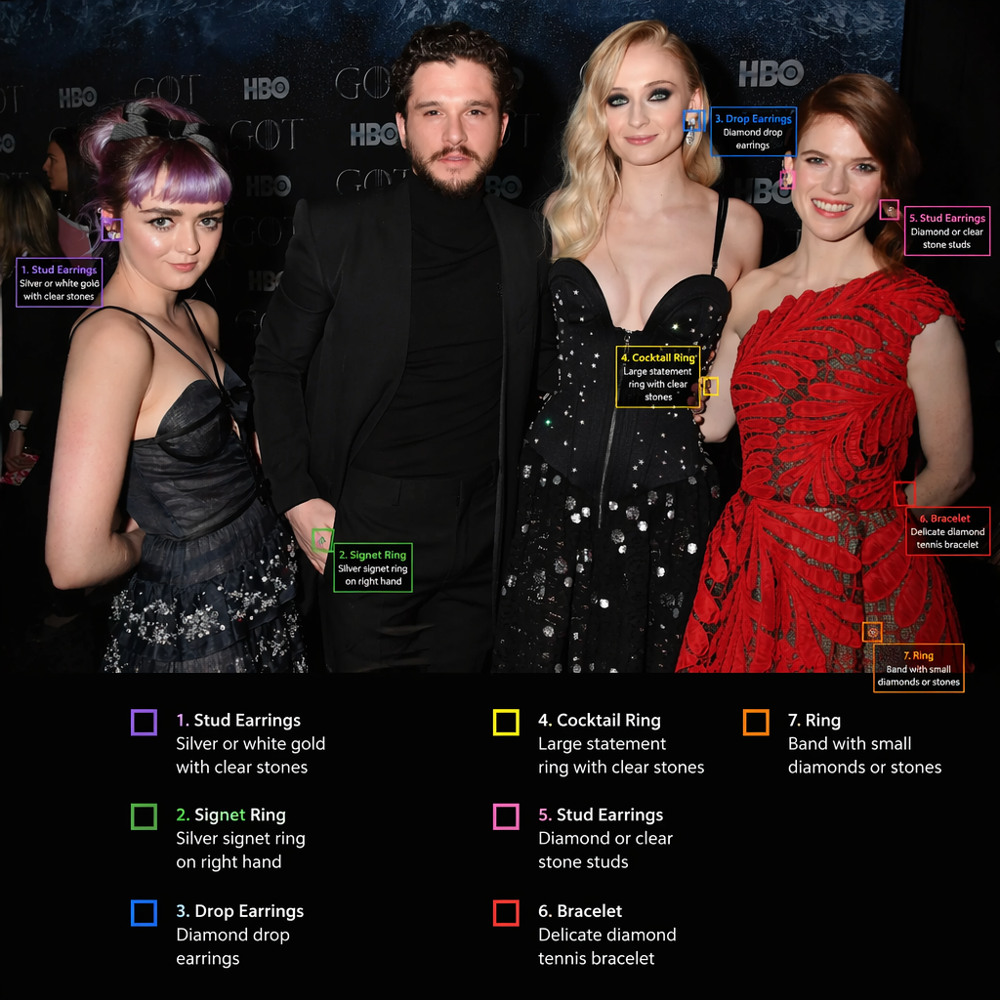

In [43]:
from dotenv import load_dotenv
import base64
from PIL import Image
from io import BytesIO
from azure.identity import DefaultAzureCredential, get_bearer_token_provider
from openai import AzureOpenAI

token_provider = get_bearer_token_provider(DefaultAzureCredential(), "https://cognitiveservices.azure.com/.default")

client = AzureOpenAI(
    azure_ad_token_provider=token_provider,
    api_version="2025-04-01-preview",
    azure_endpoint = "https://AIFSweden.cognitiveservices.azure.com")

img = client.images.edit(
  model="gpt-image-2",
    image=[
    open("./images/GOT.png", "rb"),
  ],
  prompt="Take this image and draw on bounding boxes for all the elements of jewllery (with a description)",
  background="auto",
  n=1,
  quality="low",
  size="1024x1024",
  output_format="png",
  #moderation="auto",
)

# image_bytes = base64.b64decode(img.data[0].b64_json)
# with open("ImageGen/roadmap2.png", "wb") as f:
#     f.write(image_bytes)

    
# from IPython.display import Image
# Image("ImageGen/roadmap2.png")

image_bytes = base64.b64decode(img.data[0].b64_json)
with open("./images/gotwithboxes.png", "wb") as f:
    f.write(image_bytes)
# image = Image.open(BytesIO(image_bytes))
# image.show()

from PIL import Image
from IPython.display import display
image = Image.open("./images/gotwithboxes.png")
image = image.resize((round(image.width), round(image.height)))
display(image)





# Yolo as an alternative

## Train a new model - do not run this code, it takes an hour or so to run

In [ ]:
# import yaml
# from ultralytics import YOLO

# file_path = "./Jewelry/dataset.yaml"    # path of dataset.yaml
# train_path = "./images/training/" # path of image-label data used for training
# val_path = "./images/testing/"    # path of image-label data used for testing
# num_class = 5                                             # Number of labelling class
# class_names = ['WRISTWATCH', 'BRACELET', 'EARRINGS', 'NECKLACE', 'RINGS']

# with open(file_path, 'r') as f:
#     load = yaml.load(f, Loader = yaml.FullLoader)

#     load['train'] = train_path
#     load['val'] = val_path
#     load['nc'] = num_class
#     load['names'] = class_names
#     with open(file_path, 'w') as f:
#         yaml.dump(load, f)

# # Load a model
# model = YOLO("yolo11n.pt")

# # Train the model
# train_results = model.train(
#     data="./Jewelry/dataset.yaml",  # path to dataset YAML
#     epochs=100,  # number of training epochs
#     imgsz=640,  # training image size
#     device="cpu",  # device to run on, i.e. device=0 or device=0,1,2,3 or device=cpu
# )

# # Evaluate model performance on the validation set
# metrics = model.val()

# # Perform object detection on an image
# #results = model("path/to/image.jpg")
# #results[0].show()

# # Export the model to ONNX format
# path = model.export(format="onnx")  # return path to exported model

Ultralytics 8.3.208  Python-3.13.8 torch-2.8.0+cpu CPU (AMD Ryzen 7 PRO 7840HS w/ Radeon 780M Graphics)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=./Jewelry/dataset.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, pl

## Test new model

Loading ./runs/detect/train3/weights/best.onnx for ONNX Runtime inference...


Using ONNX Runtime 1.22.1 with CPUExecutionProvider

image 1/1 c:\Users\rolester\OneDrive - Microsoft\WorkFolders\Python\AIvsML\Jewelry\images\testing\bracelet_003.jpg: 640x640 1 BRACELET, 53.5ms
Speed: 2.7ms preprocess, 53.5ms inference, 16.5ms postprocess per image at shape (1, 3, 640, 640)


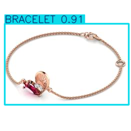

In [50]:
from ultralytics import YOLO
from PIL import Image
from IPython.display import display

model = YOLO("./runs/detect/train3/weights/best.onnx")

IMAGE_PATH = "./Jewelry/images/testing/bracelet_003.jpg"
CONF_THRESHOLD = 0.09
NMS_THRESHOLD = 0.0

# Run prediction
results = model.predict(IMAGE_PATH, conf=CONF_THRESHOLD, iou=NMS_THRESHOLD)

result = results[0]

# Draw detections
frame = result.plot()

# Fix colour (BGR → RGB)
frame = frame[..., ::-1]

# Convert to PIL + resize
image = Image.fromarray(frame)
image = image.resize((image.width // 2, image.height // 2))

# Display
display(image)

Loading ./runs/detect/train3/weights/best.onnx for ONNX Runtime inference...
Using ONNX Runtime 1.22.1 with CPUExecutionProvider



image 1/1 c:\Users\rolester\OneDrive - Microsoft\WorkFolders\Python\AIvsML\images\GOT.png: 640x640 11 WRISTWATCHs, 2 EARRINGSs, 4 RINGSs, 33.2ms
Speed: 2.4ms preprocess, 33.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


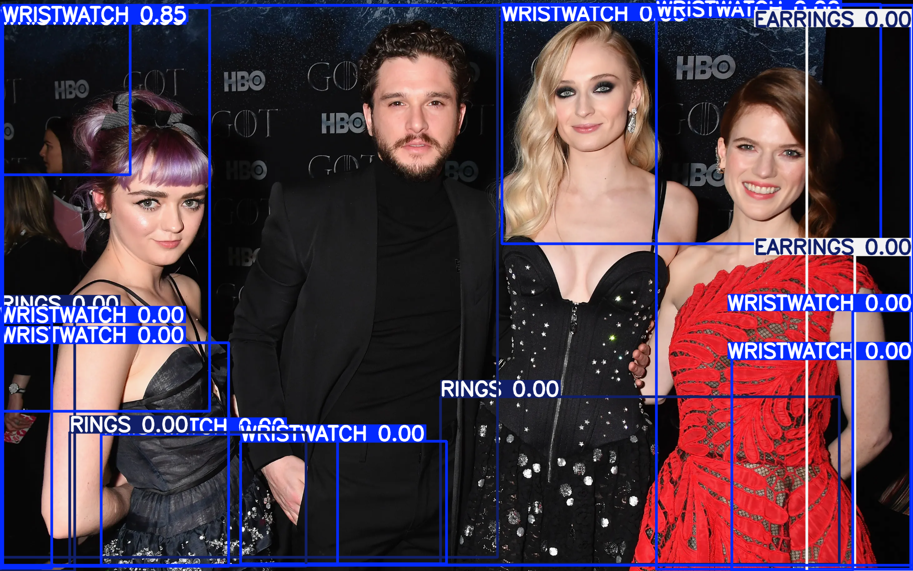

In [ ]:
import cv2
from ultralytics import YOLO

# Use the existing MODEL_PATH and IMAGE_PATH variables
model = YOLO("./runs/detect/train3/weights/best.onnx")
MODEL_PATH = "./runs/detect/train3/weights/best.onnx"
IMAGE_PATH = "images/GOT.png"
INPUT_SIZE = 640
CONF_THRESHOLD = 0.001
NMS_THRESHOLD = 0.30
class_names = ['WRISTWATCH', 'BRACELET', 'EARRINGS', 'NECKLACE', 'RINGS']

# Run prediction
results = model.predict(IMAGE_PATH, conf=CONF_THRESHOLD, iou=NMS_THRESHOLD, show=False, save=False)

result = results[0]

# Draw detections
frame = result.plot()

# Fix colour (BGR → RGB)
frame = frame[..., ::-1]

# Convert to PIL + resize
image = Image.fromarray(frame)
image = image.resize((image.width // 2, image.height // 2))

# Display
display(image)


# Use the pretrained fashion detection model


image 1/1 c:\Users\rolester\OneDrive - Microsoft\WorkFolders\Python\AIvsML\images\GOT.png: 416x640 1 long_sleeved_outwear, 1 trousers, 1 vest_dress, 2 sling_dresss, 96.9ms
Speed: 2.1ms preprocess, 96.9ms inference, 3.4ms postprocess per image at shape (1, 3, 416, 640)


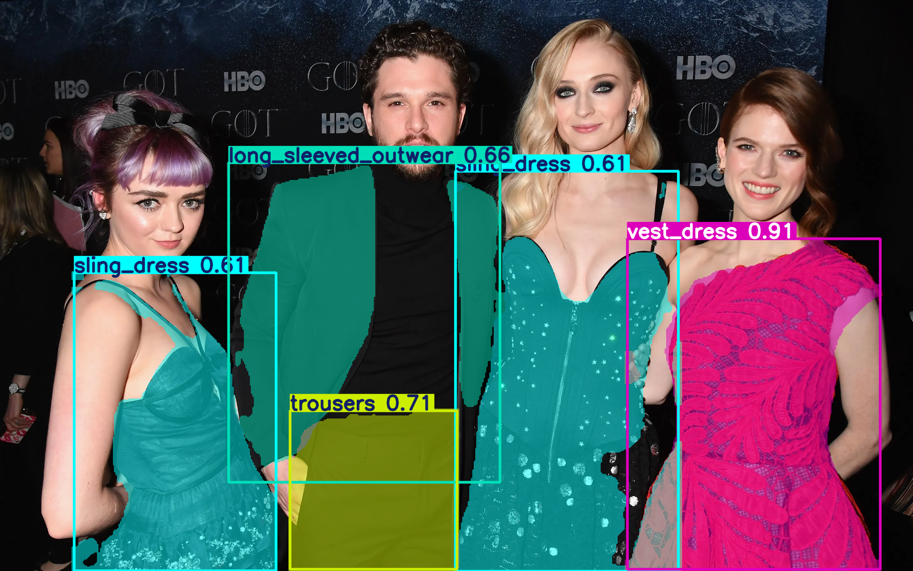

In [13]:
import cv2
from ultralytics import YOLO

# Use the existing MODEL_PATH and IMAGE_PATH variables
model = YOLO("./YOLO/deepfashion2_yolov8s-seg.pt")
MODEL_PATH = "./YOLO/deepfashion2_yolov8s-seg.pt"
IMAGE_PATH = "images/GOT.png"
INPUT_SIZE = 640
CONF_THRESHOLD = 0.60
NMS_THRESHOLD = 0.30
class_names = ['WRISTWATCH', 'BRACELET', 'EARRINGS', 'NECKLACE', 'RINGS']

# Run prediction
results = model.predict(IMAGE_PATH, conf=CONF_THRESHOLD, iou=NMS_THRESHOLD, show=False, save=False)

result = results[0]

# Draw detections
frame = result.plot()

# Fix colour (BGR → RGB)
frame = frame[..., ::-1]

# Convert to PIL + resize
image = Image.fromarray(frame)
image = image.resize((image.width // 2, image.height // 2))

# Display
display(image)


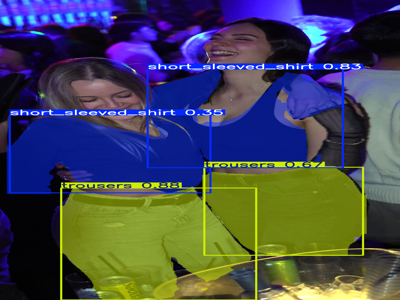

In [4]:
from ultralytics import YOLO
import urllib.request
from PIL import Image
import numpy as np
import cv2
from IPython.display import clear_output

model = YOLO("./YOLO/deepfashion2_yolov8s-seg.pt")

# Path to your video file
video_path = "video/Checkout.mp4"
video_path = "video/jewelrystore.mp4"

video_path = """video/D2.mp4"""
# Open the video
cap = cv2.VideoCapture(video_path)

# Check if video opened successfully
if not cap.isOpened():
    print("Error: Could not open video.")
    exit()


try:
    frame_skip = 10  # helps performance

    i = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Skip frames for speed (optional)
        if i % frame_skip != 0:
            i += 1
            continue

        # Run YOLO
        results = model(frame)

        # Draw detections
        img = results[0].plot()

        # Fix colour (BGR → RGB)
        img = img[..., ::-1]

        # Resize for notebook display
        img_small = Image.fromarray(img).resize((400, 300))

        # Display inline
        clear_output(wait=True)
        display(img_small)

        i += 1

except KeyboardInterrupt:
    print("Stopped manually")

finally:
    cap.release()


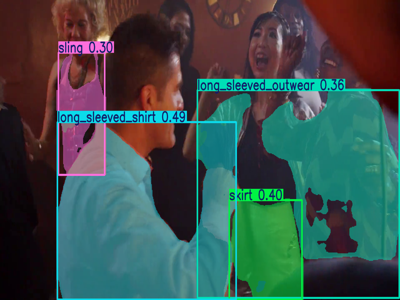

In [5]:
from ultralytics import YOLO
import urllib.request
from PIL import Image
import numpy as np
import cv2
from IPython.display import clear_output

model = YOLO("./YOLO/deepfashion2_yolov8s-seg.pt")

# Path to your video file
video_path = "video/Checkout.mp4"
video_path = "video/jewelrystore.mp4"

video_path = """video/D1.mp4"""
# Open the video
cap = cv2.VideoCapture(video_path)

# Check if video opened successfully
if not cap.isOpened():
    print("Error: Could not open video.")
    exit()


try:
    frame_skip = 5  # helps performance

    i = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Skip frames for speed (optional)
        if i % frame_skip != 0:
            i += 1
            continue

        # Run YOLO
        results = model(frame)

        # Draw detections
        img = results[0].plot()

        # Fix colour (BGR → RGB)
        img = img[..., ::-1]

        # Resize for notebook display
        img_small = Image.fromarray(img).resize((400, 300))

        # Display inline
        clear_output(wait=True)
        display(img_small)

        i += 1

except KeyboardInterrupt:
    print("Stopped manually")

finally:
    cap.release()


# Shopping - checkout items

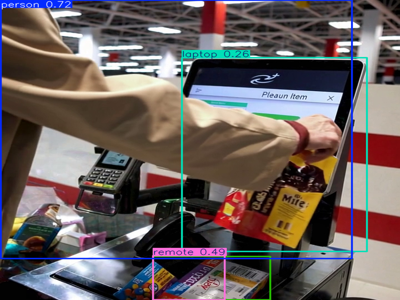

In [57]:
from ultralytics import YOLO
import urllib.request
from PIL import Image
import numpy as np
import cv2

model = YOLO("yolo11n.pt")

# Path to your video file
video_path = "video/Checkout.mp4"

# Open the video
cap = cv2.VideoCapture(video_path)

# Check if video opened successfully
if not cap.isOpened():
    print("Error: Could not open video.")
    exit()


try:
    frame_skip = 2  # helps performance

    i = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Skip frames for speed (optional)
        if i % frame_skip != 0:
            i += 1
            continue

        # Run YOLO
        results = model(frame)

        # Draw detections
        img = results[0].plot()

        # Fix colour (BGR → RGB)
        img = img[..., ::-1]

        # Resize for notebook display
        img_small = Image.fromarray(img).resize((400, 300))

        # Display inline
        clear_output(wait=True)
        display(img_small)

        i += 1

except KeyboardInterrupt:
    print("Stopped manually")

finally:
    cap.release()
